In [1]:
%load_ext lab_black

In [2]:
import itertools

import pandas as pd
import spacy
import gensim
import fasttext
import umap
import altair as alt

from tqdm.notebook import tqdm

## Load Data and NLP Model

In [3]:
df_recipes = pd.read_csv("../../data/sparkrecipes_base.csv")
df_recipes

,recipe_id,title,total_calories,url,servings
0,5,20-Minute Chicken Creole,269.3,https://recipes.sparkpeople.com/recipe-detail....,1.0
1,11,Corn Chowder,202.5,https://recipes.sparkpeople.com/recipe-detail....,1.0
2,19,Turkey Stuffed Cabbage,155.5,https://recipes.sparkpeople.com/recipe-detail....,10.0
3,21,Chicken Marsala,304.0,https://recipes.sparkpeople.com/recipe-detail....,1.0
4,25,Easy Lemon Chicken,318.0,https://recipes.sparkpeople.com/recipe-detail....,4.0
...,...,...,...,...,...
594361,3199939,2 FEV 17 Lemon cheese cake fat bomb,122.9,https://recipes.sparkpeople.com/recipe-detail....,14.0
594362,3199943,Lentil soup,117.8,https://recipes.sparkpeople.com/recipe-detail....,6.0
594363,3199965,White chocolate cranberry mug cake,464.4,https://recipes.sparkpeople.com/recipe-detail....,1.0
594364,3199966,THM Turtle Bars,301.1,https://recipes.sparkpeople.com/recipe-detail....,16.0


## Train Word Embeddings

In [4]:
df_recipes["title"] = df_recipes.title.str.lower()

In [5]:
df_recipes[["title"]].to_csv("titles.csv", header=False, index=False)

In [6]:
!head titles.csv

20-minute chicken creole
corn chowder 
turkey stuffed cabbage 
chicken marsala
easy lemon chicken 
bavarian beef 
hearty beef & vegetable stew
garden potato salad 
garlic mashed potatoes 
green beans sauté


In [7]:
model = fasttext.train_unsupervised("titles.csv", model="skipgram")

In [8]:
all_vecs = df_recipes.title.map(
    lambda t: model.get_sentence_vector(t.replace("\n", ""))
)

In [9]:
df_recipes["title_vec"] = all_vecs

In [19]:
df_recipes

,recipe_id,title,total_calories,url,servings,title_vec
0,5,20-minute chicken creole,269.3,https://recipes.sparkpeople.com/recipe-detail....,1.0,"[-0.07287385, 0.12615256, -0.07997021, 0.02324..."
1,11,corn chowder,202.5,https://recipes.sparkpeople.com/recipe-detail....,1.0,"[0.058919508, -0.06086953, -0.053182293, 0.094..."
2,19,turkey stuffed cabbage,155.5,https://recipes.sparkpeople.com/recipe-detail....,10.0,"[-0.11570293, 0.122299634, -0.038997754, 0.107..."
3,21,chicken marsala,304.0,https://recipes.sparkpeople.com/recipe-detail....,1.0,"[0.052535754, 0.060142305, -0.043947503, -0.01..."
4,25,easy lemon chicken,318.0,https://recipes.sparkpeople.com/recipe-detail....,4.0,"[0.021222461, 0.12043421, -0.021770878, -0.019..."
...,...,...,...,...,...,...
594361,3199939,2 fev 17 lemon cheese cake fat bomb,122.9,https://recipes.sparkpeople.com/recipe-detail....,14.0,"[-0.02420161, 0.0453688, -0.037841246, -0.0067..."
594362,3199943,lentil soup,117.8,https://recipes.sparkpeople.com/recipe-detail....,6.0,"[-0.055767808, 0.07053448, -0.03571613, -0.001..."
594363,3199965,white chocolate cranberry mug cake,464.4,https://recipes.sparkpeople.com/recipe-detail....,1.0,"[-0.013810364, -0.019174559, -0.0055598766, -0..."
594364,3199966,thm turtle bars,301.1,https://recipes.sparkpeople.com/recipe-detail....,16.0,"[0.058858573, -0.03870748, 0.035942458, 0.0277..."


In [11]:
del model

In [12]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(df_recipes.title_vec.values.tolist())

/home/mike/.conda/envs/seefood/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../home/mike/.conda/envs/seefood/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/mike/.conda/envs/seefood/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../..

In [13]:
df_recipes["umap_x"] = embedding[:, 0]
df_recipes["umap_y"] = embedding[:, 1]

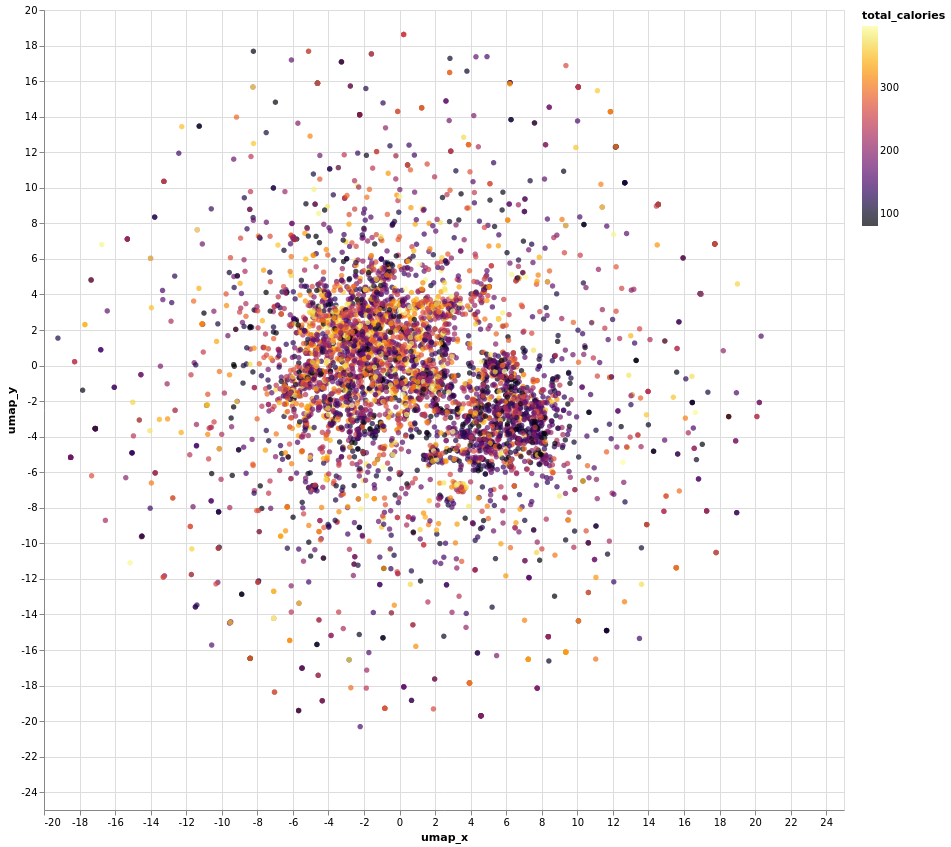

In [21]:
alt.Chart(
    df_recipes[
        (df_recipes.total_calories > 80) & (df_recipes.total_calories < 400)
    ].sample(5000)
).mark_circle().encode(
    x="umap_x",
    y="umap_y",
    tooltip="title",
    color=alt.Color("total_calories", scale=alt.Scale(scheme="inferno")),
).properties(
    width=800, height=800
).interactive()

## Pre-Processing with Gensim and Spacy

In [4]:
nlp = spacy.load("en_core_web_lg")

KeyboardInterrupt: 

In [ ]:
sents = df_recipes.title.map(lambda t: gensim.utils.simple_preprocess(t, deacc=True))

In [ ]:
bigram = gensim.models.Phrases(sents, min_count=150, threshold=1, scoring="default")
bigram_mod = gensim.models.phrases.Phraser(bigram)

In [34]:
def make_bigrams(sents, bigram_mod):
    return [bigram_mod[s] for s in sents]


def compute_labels(bigrams):
    result = []
    for i, b in tqdm(list(enumerate(bigrams))):
        doc = nlp(" ".join(b))
        labels = set([chunk.root.text for chunk in doc.noun_chunks])
        if len(labels) == 0 and len(b) > 0:
            labels = set([b[0]])
        result.append(labels)
        if i % 1000 == 0:
            print(f"Iteration {i}: {b} -> {labels}")
    return result

In [35]:
bigrams = make_bigrams(sents, bigram_mod)

df_recipes["labels"] = compute_labels(bigrams)

Iteration 0: ['cheese', 'fondue'] -> {'fondue'}
Iteration 1000: ['pesto', 'gnocchi'] -> {'gnocchi'}
Iteration 2000: ['grilled', 'chicken', 'and', 'roasted', 'red', 'pepper', 'roll', 'up'] -> {'chicken', 'pepper'}
Iteration 3000: ['spicy', 'sausage', 'fajitas'] -> {'fajitas'}
Iteration 4000: ['shadicar', 'shrimp', 'and', 'grits'] -> {'grits', 'shrimp'}
Iteration 5000: ['warm', 'apple', 'slices'] -> {'slices'}
Iteration 6000: ['amazing', 'peanut', 'butter', 'chocolate', 'chip', 'oatmeal', 'cookies'] -> {'cookies'}
Iteration 7000: ['whole', 'wheat', 'banana', 'streusel', 'muffins'] -> {'muffins'}
Iteration 8000: ['pumpkin', 'spice', 'muffins'] -> {'muffins'}
Iteration 9000: ['veggiechicken', 'with', 'tagliatelles'] -> {'tagliatelles'}



In [42]:
df_recipes.sample(10)

,recipe_id,title,total_calories,url,servings,labels
479196,2356698,Sugar Free Macaroons,42.5,https://recipes.sparkpeople.com/recipe-detail....,42.0,{macaroons}
25304,96388,No-Bake Mocha Chocolate,248.4,https://recipes.sparkpeople.com/recipe-detail....,8.0,{chocolate}
91868,340401,Whole Wheat Pancakes,197.9,https://recipes.sparkpeople.com/recipe-detail....,2.0,{pancakes}
544040,2789307,Katjya's Curried Pumpkin Soup,103.9,https://recipes.sparkpeople.com/recipe-detail....,4.0,{soup}
524165,2652147,Turkey Black Bean Burgers,118.3,https://recipes.sparkpeople.com/recipe-detail....,18.0,{burgers}
320544,1427872,Cauliflower Tomato Soup,110.9,https://recipes.sparkpeople.com/recipe-detail....,4.0,{soup}
218980,875674,paleo meatloaf,344.1,https://recipes.sparkpeople.com/recipe-detail....,7.0,{meatloaf}
426998,2035806,Shepherd's Pie,323.7,https://recipes.sparkpeople.com/recipe-detail....,6.0,{pie}
301749,1328871,Sugar Free Pumpkin Muffin,75.5,https://recipes.sparkpeople.com/recipe-detail....,21.0,{muffin}
341650,1551750,yogurt jello,74.0,https://recipes.sparkpeople.com/recipe-detail....,8.0,{jello}


In [43]:
def get_all_labels(df):
    return pd.Series(itertools.chain(*df["labels"]))

In [44]:
all_labels = get_all_labels(df_recipes)

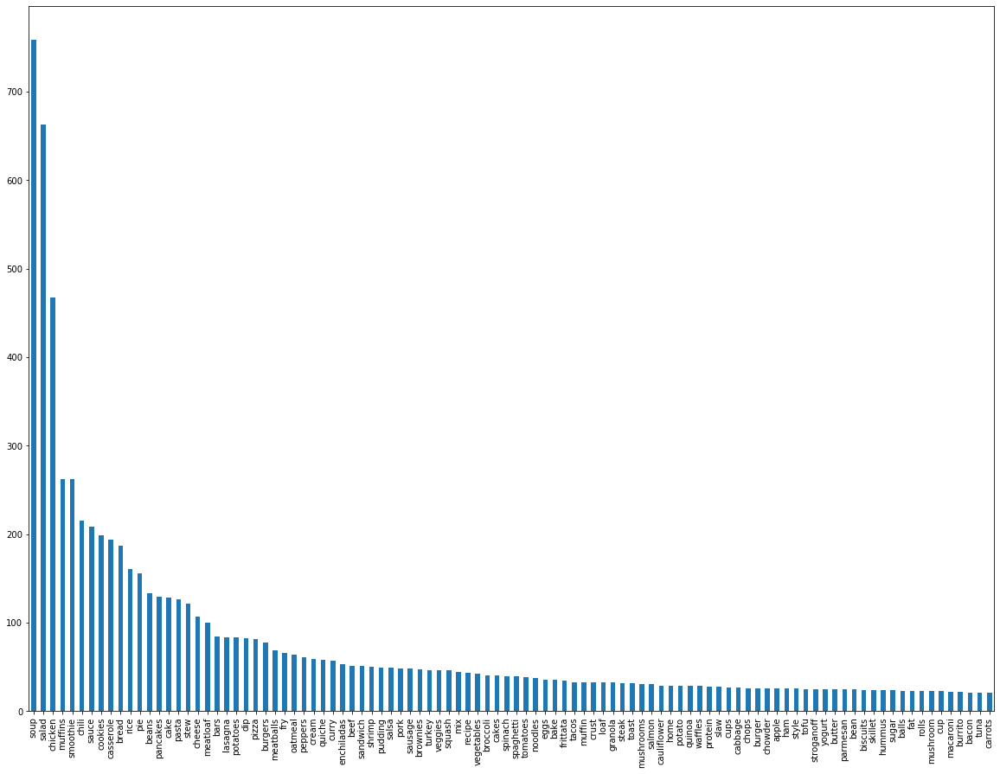

In [45]:
all_labels.value_counts().nlargest(100).plot.bar(figsize=(20, 15))

In [46]:
val_counts = all_labels.value_counts()
val_counts.shape

(1795,)

In [55]:
df_recipes[df_recipes.labels.map(lambda labels: "pancakes" in labels)].sort_values(
    by="total_calories"
).describe()

,recipe_id,total_calories,servings
count,1.290000e+02,129.000000,129.000000
mean,1.436638e+06,172.217054,8.069767
std,9.077856e+05,125.772630,6.822740
min,4.955000e+03,4.100000,1.000000
25%,5.948430e+05,91.800000,3.000000
50%,1.537418e+06,144.400000,6.000000
75%,2.252468e+06,203.700000,12.000000
max,3.176963e+06,942.400000,36.000000
